# Import packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from importlib import reload
%matplotlib inline
from matplotlib import rcParams
rcParams["axes.formatter.useoffset"] = False
rcParams['axes.formatter.limits'] = -15,15
rcParams['mathtext.fontset'] = 'stix'
rcParams['font.family'] = 'STIXGeneral'
rcParams['xtick.direction']='in'
rcParams['ytick.direction']='in'
#import sys
#sys.path.pop(0)

# Import rmfit

In [2]:
import rmfit
rmfit

GKS test: The py23 module has been deprecated and will be removed in a future release. Please update your code.


<module 'rmfit' from '/Users/gks/Dropbox/mypylib/notebooks/GIT/rmfit/__init__.py'>

### Read in 1 photometric and 1 RM transit from https://ui.adsabs.harvard.edu/abs/2022ApJ...931L..15S/abstract

Text(0, 0.5, 'Flux')

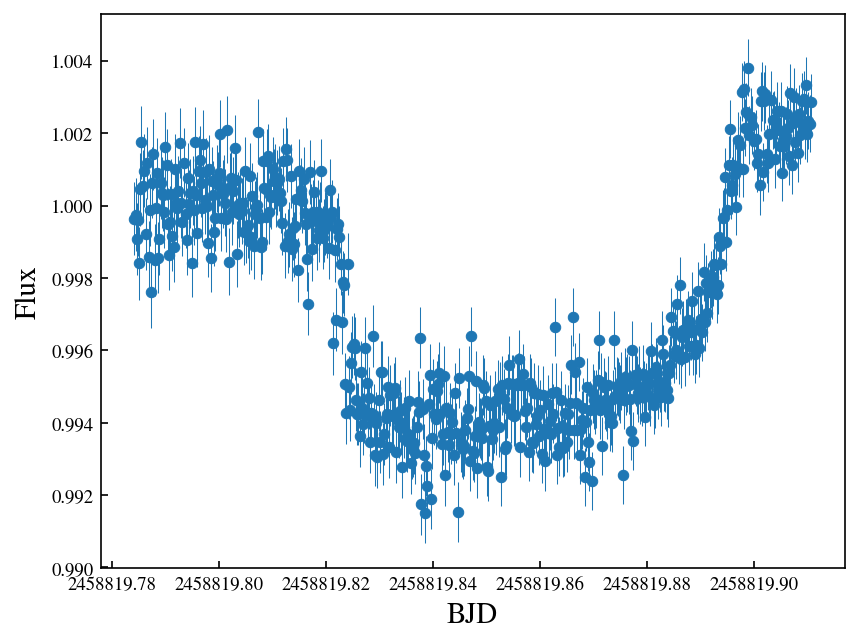

In [3]:
df_t = pd.read_csv('../data/example/05_gj3470/diffuser_transits_fig1ab.mrt',
                   skiprows=22,header=None,delim_whitespace=True,names=['bjd','f','e','model','gp','ntransit'])
df_t = df_t[df_t.ntransit ==1]
fig, ax = plt.subplots(dpi=150)
ax.errorbar(df_t.bjd.values,df_t.f.values,df_t.e.values,marker='o',lw=0,mew=0.5,capsize=0,elinewidth=0.5,)
ax.set_xlabel('BJD',fontsize=14)
ax.set_ylabel('Flux',fontsize=14)

Text(0, 0.5, 'RV [m/s]')

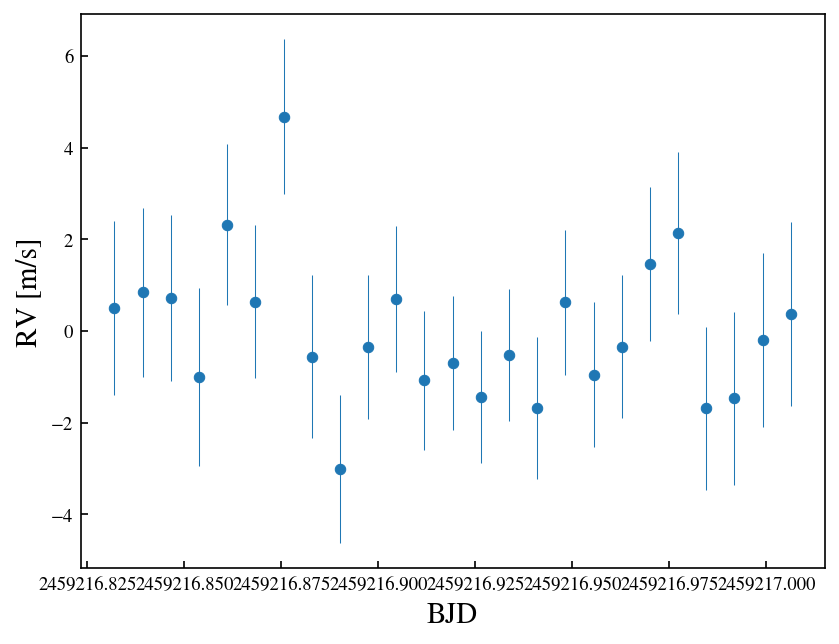

In [4]:
df_r = pd.read_csv('../data/example/05_gj3470/in_transit_rvs_fig1cd.mrt',
                   skiprows=19,header=None,delim_whitespace=True,names=['bjd','rv','e','ntransit'])
df_r = df_r[df_r.ntransit ==0]
fig, ax = plt.subplots(dpi=150)
ax.errorbar(df_r.bjd.values,df_r.rv.values,df_r.e.values,marker='o',lw=0,mew=0.5,capsize=0,elinewidth=0.5,)
ax.set_xlabel('BJD',fontsize=14)
ax.set_ylabel('RV [m/s]',fontsize=14)

# Read in prior file 

In [5]:
f = '../data/example/05_gj3470/gj3470_priors.dat'
inp = {}
inp['time_rv1'] = df_r.bjd.values
inp['rv_rv1']   = df_r.rv.values
inp['e_rv1']    = df_r.e.values
inp['time_tr1'] = df_t.bjd.values
inp['f_tr1']    = df_t.f.values
inp['e_tr1']    = df_t.e.values

L = rmfit.rmfit.LPFunction1RM1Phot(inp,f)
TF = rmfit.rmfit.RMFit(L)

Reading in priorfile from ../data/example/05_gj3470/gj3470_priors.dat
   prior          arg1        arg2            label      description  \
0     NP  2.456341e+06    0.000100            t0_p1            t0_p1   
1     NP  3.336653e+00    0.000003             P_p1             P_p1   
2     UP -1.800000e+02  180.000000           lam_p1           lam_p1   
3     UP  0.000000e+00   10.000000            vsini            vsini   
4     UP  8.000000e+01   90.000000           inc_p1           inc_p1   
5     UP  0.000000e+00    0.200000             p_p1             p_p1   
6     UP  5.000000e+00   30.000000             a_p1             a_p1   
7     NP  3.500000e-01    0.100000           u1_rv1           u1_rv1   
8     NP  3.200000e-01    0.050000           u2_rv1           u2_rv1   
9     NP  3.500000e-01    0.100000           u1_tr1           u1_tr1   
10    NP  3.200000e-01    0.050000           u2_tr1           u2_tr1   
11    NP  1.250000e-01    0.042000           ecc_p1           ecc_

In [6]:
TF.minimize_PyDE(mcmc=False)

Running PyDE Optimizer
Optimized using PyDE
Final parameters:
          labels       centers         lower         upper            pv  center_dist
0          t0_p1  2.456341e+06  2.456341e+06  2.456341e+06  2.456341e+06    -0.000313
1           P_p1  3.336653e+00  3.336637e+00  3.336669e+00  3.336652e+00     0.000001
2         lam_p1  0.000000e+00 -1.800000e+02  1.800000e+02  8.981245e+01   -89.812446
3          vsini  5.000000e+00  0.000000e+00  1.000000e+01  4.542035e-01     4.545797
4         inc_p1  8.500000e+01  8.000000e+01  9.000000e+01  8.924471e+01    -4.244713
5           p_p1  1.000000e-01  0.000000e+00  2.000000e-01  7.752123e-02     0.022479
6           a_p1  1.750000e+01  5.000000e+00  3.000000e+01  1.518644e+01     2.313557
7         u1_rv1  3.500000e-01 -1.500000e-01  8.500000e-01  2.481851e-01     0.101815
8         u2_rv1  3.200000e-01  7.000000e-02  5.700000e-01  4.251150e-01    -0.105115
9         u1_tr1  3.500000e-01 -1.500000e-01  8.500000e-01  3.566312e-01    -0

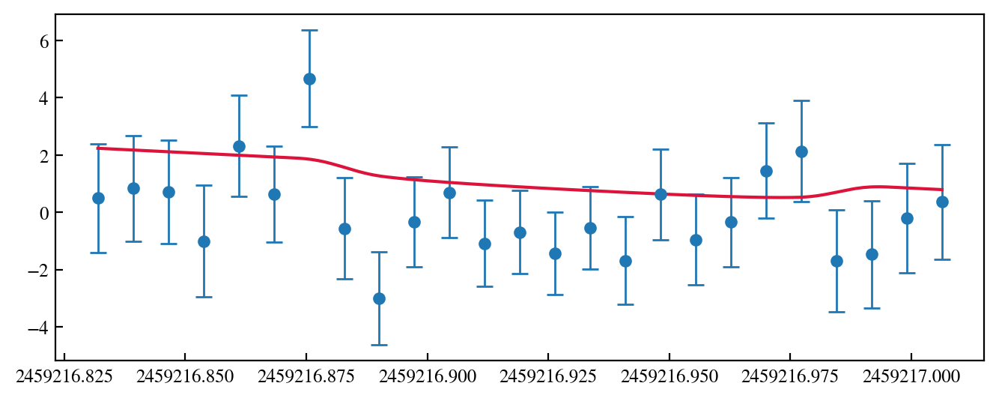

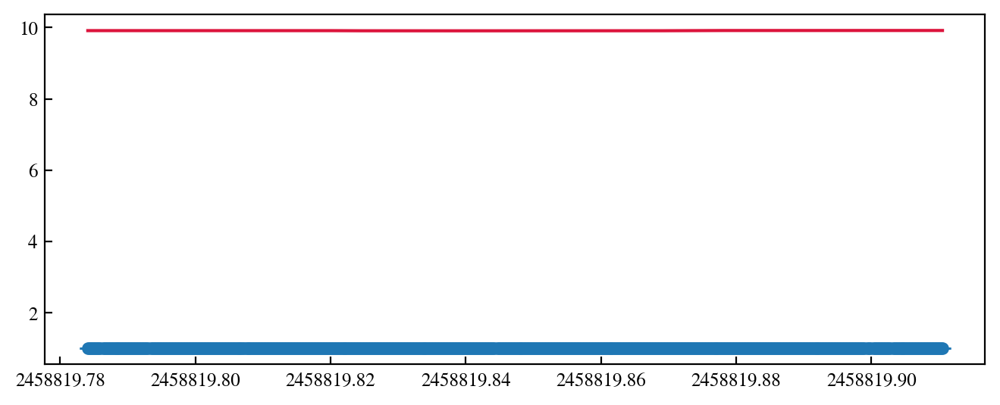

In [7]:
pv = TF.min_pv

r1,t2 = TF.lpf.compute_total_model(pv)
s1    = 0.#pv[12]
s2    = 0.#pv[13]

tt1 = np.linspace(TF.lpf.data_rv1['time'][0],TF.lpf.data_rv1['time'][-1],400)
tt2 = np.linspace(TF.lpf.data_tr1['time'][0],TF.lpf.data_tr1['time'][-1],400)
rr1, tr1 = TF.lpf.compute_total_model(pv,tt1,tt2)

fig, ax = plt.subplots(dpi=200,figsize=(8,3))
ax.errorbar(TF.lpf.data_rv1['time'],TF.lpf.data_rv1['y'],TF.lpf.data_rv1['error'],marker='o',elinewidth=1,capsize=4,lw=0,mew=1)
#ax.plot(TF.lpf.data1['time'],m1-r1,color='crimson')
ax.plot(tt1,rr1,color='crimson',ls="-")

fig, ax = plt.subplots(dpi=200,figsize=(8,3))
ax.errorbar(TF.lpf.data_tr1['time'],TF.lpf.data_tr1['y'],TF.lpf.data_tr1['error'],marker='o',elinewidth=1,capsize=4,lw=0,mew=1)
ax.plot(tt2,tr1,color='crimson',ls="-")


# MCMC 

In [8]:
f = '../data/example/05_gj3470/gj3470_priors.dat'
inp = {}
inp['time_rv1'] = df_r.bjd.values
inp['rv_rv1']   = df_r.rv.values
inp['e_rv1']    = df_r.e.values
inp['time_tr1'] = df_t.bjd.values
inp['f_tr1']    = df_t.f.values
inp['e_tr1']    = df_t.e.values

L = rmfit.rmfit.LPFunction1RM1Phot(inp,f)
TF = rmfit.rmfit.RMFit(L)
TF.minimize_PyDE(mcmc=True,mc_iter=4000,npop=60)

Reading in priorfile from ../data/example/05_gj3470/gj3470_priors.dat
   prior          arg1        arg2            label      description  \
0     NP  2.456341e+06    0.000100            t0_p1            t0_p1   
1     NP  3.336653e+00    0.000003             P_p1             P_p1   
2     UP -1.800000e+02  180.000000           lam_p1           lam_p1   
3     UP  0.000000e+00   10.000000            vsini            vsini   
4     UP  8.000000e+01   90.000000           inc_p1           inc_p1   
5     UP  0.000000e+00    0.200000             p_p1             p_p1   
6     UP  5.000000e+00   30.000000             a_p1             a_p1   
7     NP  3.500000e-01    0.100000           u1_rv1           u1_rv1   
8     NP  3.200000e-01    0.050000           u2_rv1           u2_rv1   
9     NP  3.500000e-01    0.100000           u1_tr1           u1_tr1   
10    NP  3.200000e-01    0.050000           u2_tr1           u2_tr1   
11    NP  1.250000e-01    0.042000           ecc_p1           ecc_

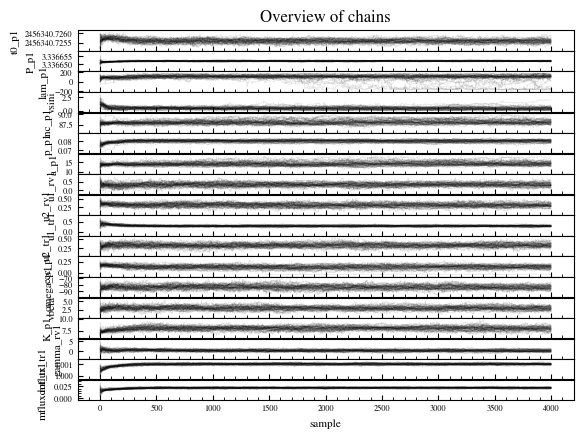

In [9]:
rmfit.mcmc_help.plot_chains(TF.sampler.chain,labels=TF.lpf.ps_vary.labels)

In [10]:
# Make flatchain and posteriors
burnin_index = 2000
chains_after_burnin = TF.sampler.chain[:,burnin_index:,:]
flatchain = chains_after_burnin.reshape((-1,len(TF.lpf.ps_vary.priors)))
df_post = pd.DataFrame(flatchain,columns=TF.lpf.ps_vary.labels)
df_post

,t0_p1,P_p1,lam_p1,vsini,inc_p1,p_p1,a_p1,u1_rv1,u2_rv1,u1_tr1,u2_tr1,ecc_p1,omega_p1,vbeta,K_p1,gamma_rv1,mflux_tr1,mfluxdot_tr1
0,2.456341e+06,3.336652,93.091409,0.479626,87.836594,0.082423,13.746422,0.419941,0.275464,0.260257,0.357239,0.162235,-87.746976,3.130547,7.869134,0.364318,1.001062,0.022737
1,2.456341e+06,3.336652,101.112510,0.449242,87.797876,0.082288,13.642591,0.394600,0.274707,0.256000,0.339162,0.157867,-86.830358,3.091556,7.760829,0.350477,1.001053,0.022515
2,2.456341e+06,3.336652,101.112510,0.449242,87.797876,0.082288,13.642591,0.394600,0.274707,0.256000,0.339162,0.157867,-86.830358,3.091556,7.760829,0.350477,1.001053,0.022515
3,2.456341e+06,3.336652,101.112510,0.449242,87.797876,0.082288,13.642591,0.394600,0.274707,0.256000,0.339162,0.157867,-86.830358,3.091556,7.760829,0.350477,1.001053,0.022515
4,2.456341e+06,3.336652,100.937202,0.447708,87.795415,0.082305,13.635682,0.395201,0.274899,0.255845,0.339322,0.157740,-86.842631,3.088295,7.756650,0.350200,1.001054,0.022535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119995,2.456341e+06,3.336652,122.932075,0.714747,88.238064,0.080101,14.247386,0.302171,0.259605,0.253619,0.267737,0.090731,-87.863839,2.909237,8.791673,0.579369,1.000987,0.022130
119996,2.456341e+06,3.336652,121.188005,0.664834,88.295394,0.079890,14.419954,0.307208,0.270663,0.273564,0.273769,0.103382,-87.574668,2.943631,8.481678,0.473888,1.000976,0.021739
119997,2.456341e+06,3.336652,121.188005,0.664834,88.295394,0.079890,14.419954,0.307208,0.270663,0.273564,0.273769,0.103382,-87.574668,2.943631,8.481678,0.473888,1.000976,0.021739
119998,2.456341e+06,3.336652,121.188005,0.664834,88.295394,0.079890,14.419954,0.307208,0.270663,0.273564,0.273769,0.103382,-87.574668,2.943631,8.481678,0.473888,1.000976,0.021739


In [11]:
# Assess convergence, should be close to 1 (usually within a few percent, if not, then rerun MCMC with more steps)
# This example for example would need a lot more steps, but keeping steps fewer for a quick minimal example
# Usually good to let it run for 10000 - 20000 steps for a 'production run'
rmfit.mcmc_help.gelman_rubin(chains_after_burnin)

array([1.11446698, 1.12434739, 1.68357593, 1.22118645, 1.20516278,
       1.20850423, 1.20064907, 1.11312968, 1.18059732, 1.16659447,
       1.12237518, 1.37902863, 1.16370245, 1.17075597, 1.14381559,
       1.20915729, 1.12946942, 1.09812779])

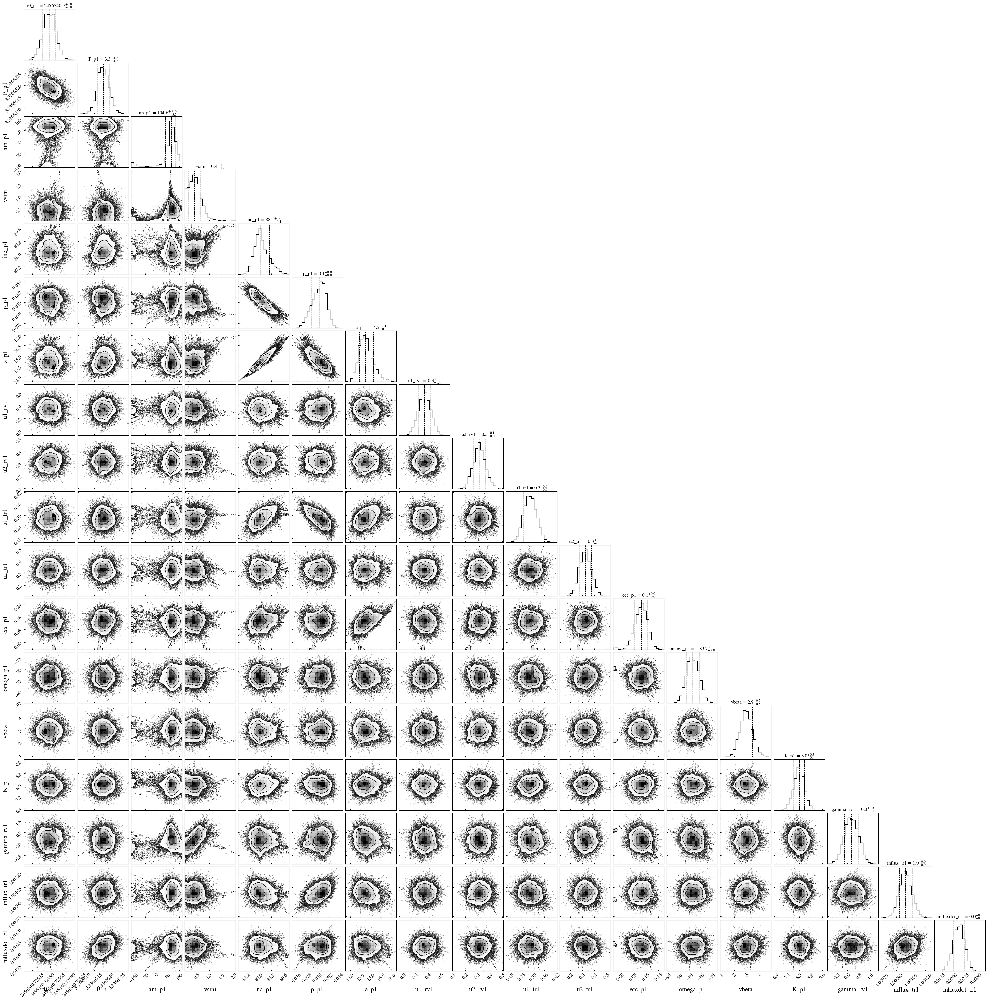

In [12]:
# Plot corner plot
fig = rmfit.mcmc_help.plot_corner(chains_after_burnin,
       show_titles=True,labels=np.array(TF.lpf.ps_vary.descriptions),title_fmt='.1f',xlabcord=(0.5, -0.2))

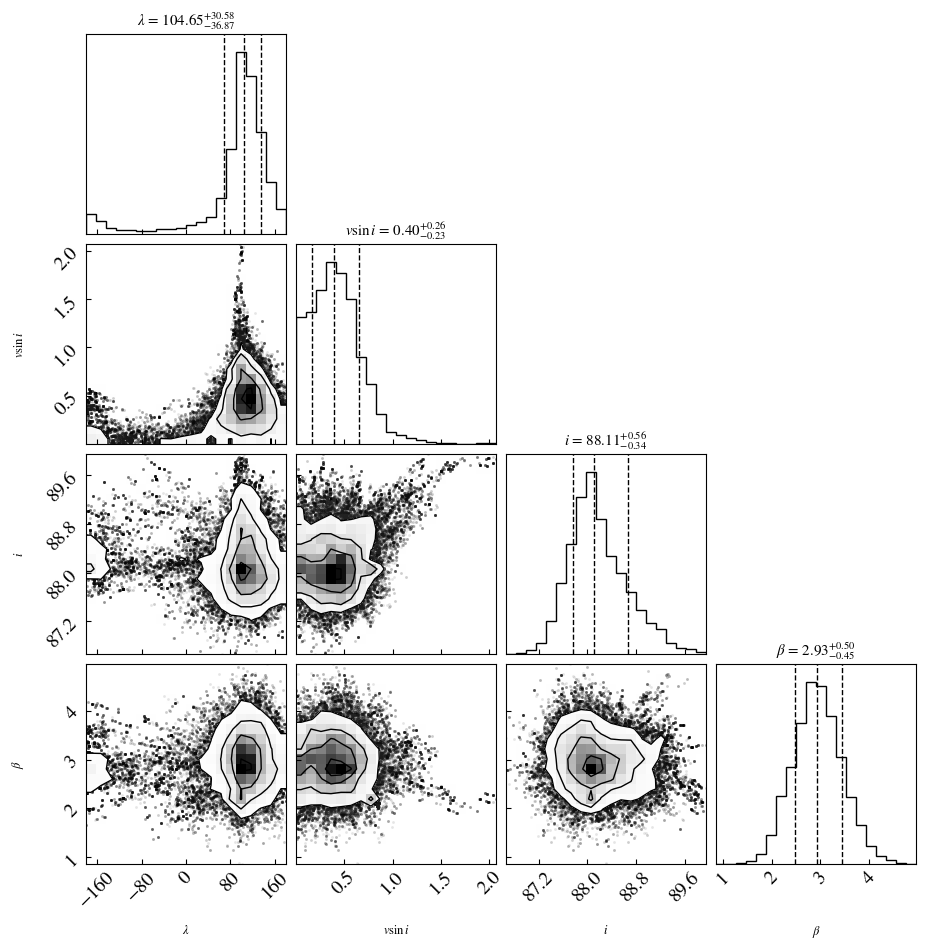

In [13]:
# Narrow down on the lambda and vsini
# without last pointt
import corner
fig = corner.corner(df_post[['lam_p1','vsini','inc_p1','vbeta']],show_titles=True,quantiles=[0.18,0.5,0.84],
                    labels=['$\lambda$','$v \sin i$','$i$',r'$\beta$'])
fig.dpi=100

In [14]:
# Check Autocorrelation
#import numpy as np
#from emcee.autocorr import integrated_time
#chain = TF.sampler.chain
#tau = np.mean([integrated_time(walker) for walker in chain], axis=0)

In [15]:
flatchain = TF.sampler.chain[:,::2000,:].reshape((-1,len(TF.lpf.ps_vary.priors)))
df_post = pd.DataFrame(flatchain,columns=TF.lpf.ps_vary.labels)

# Print median values
df_medvals = TF.get_mean_values_mcmc_posteriors(df_post.values)
df_medvals

,medvals,minus,plus,values,Labels,Description
0,2.456341e+06,0.000144,1.868238e-04,$2456340.7256_{-0.00014}^{+0.00019}$,t0_p1,t0_p1
0,3.336652e+00,0.000001,4.283144e-07,$3.33665179_{-0.000001}^{+0.0000004}$,P_p1,P_p1
0,9.560221e+01,81.337165,3.589935e+01,$96.0_{-81.0}^{+36.0}$,lam_p1,lam_p1
0,6.622106e-01,0.414427,8.987329e-01,$0.66_{-0.41}^{+0.90}$,vsini,vsini
0,8.791795e+01,0.636110,5.860123e-01,$87.92_{-0.64}^{+0.59}$,inc_p1,inc_p1
0,7.906322e-02,0.004502,2.178076e-03,$0.0791_{-0.0045}^{+0.0022}$,p_p1,p_p1
0,1.386945e+01,1.525566,9.807818e-01,$13.87_{-1.5}^{+0.98}$,a_p1,a_p1
0,3.527893e-01,0.179758,1.778803e-01,$0.35_{-0.18}^{+0.18}$,u1_rv1,u1_rv1
0,3.277964e-01,0.069536,9.659838e-02,$0.328_{-0.070}^{+0.097}$,u2_rv1,u2_rv1
0,2.933169e-01,0.051538,1.938725e-01,$0.293_{-0.052}^{+0.19}$,u1_tr1,u1_tr1


# Plot Fit

Sampling, i= 0
Sampling, i= 100
Sampling, i= 200
Sampling, i= 300
Sampling, i= 400
Sampling, i= 500
Sampling, i= 600
Sampling, i= 700
Sampling, i= 800
Sampling, i= 900


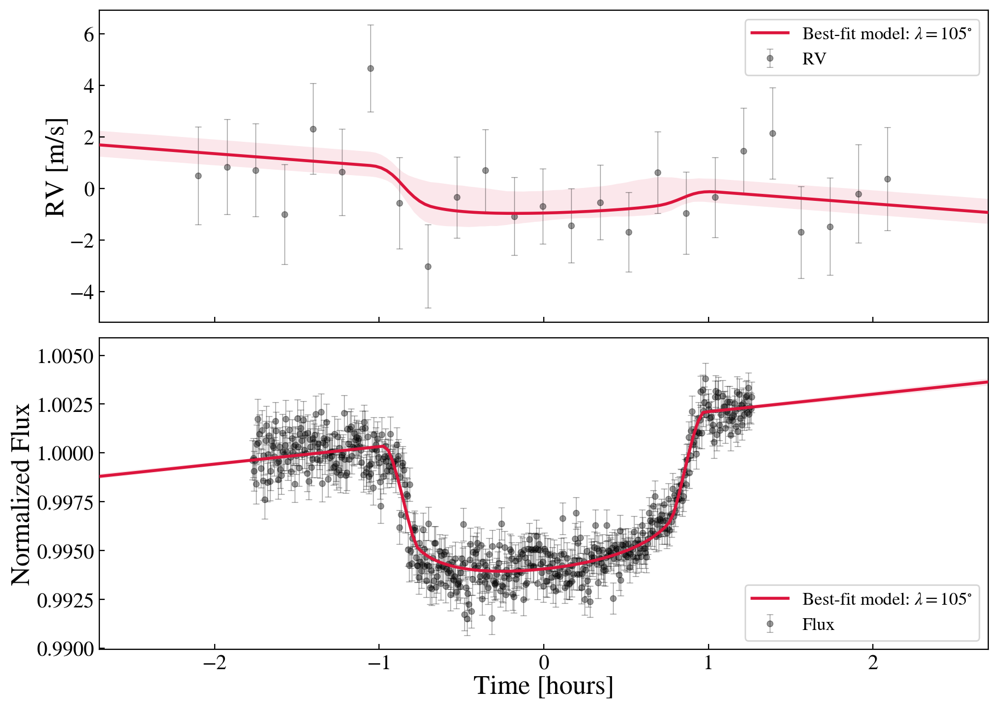

In [16]:
NBIN = 2

P = df_medvals.medvals.values[df_medvals.Labels=='P_p1'][0]
T0 = df_medvals.medvals.values[df_medvals.Labels=='t0_p1'][0]

t01 = rmfit.transit_time_from_ephem(inp['time_rv1'][0],P,T0)
t02 = rmfit.transit_time_from_ephem(inp['time_tr1'][0],P,T0)

markercolor="black"
shadecolor="crimson"
ALPHA=0.4

flatchain = chains_after_burnin.reshape((-1,len(TF.lpf.ps_vary.priors)))

times1 = np.linspace(TF.lpf.data_rv1['time'][0]-0.02,TF.lpf.data_rv1['time'][-1]+0.02,500)
times2 = np.linspace(TF.lpf.data_tr1['time'][0]-0.02,TF.lpf.data_tr1['time'][-1]+0.02,500)

pv_50 = np.percentile(flatchain,[50],axis=0)[0]
s1 = 0.
s2 = 0.
t1_mod = np.linspace(times1.min()-0.1,times1.max()+0.1,300)
t2_mod = np.linspace(times2.min()-0.1,times2.max()+0.1,300)
rv_50_1, ff_50_1 = TF.lpf.compute_total_model(pv_50,times_rv1=t1_mod,times_tr1=t2_mod)

gamma1 = TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv1')
mflux = TF.lpf.get_jump_parameter_value(pv_50,'mflux_tr1')

# Plot random samples
fig, (ax,bx) = plt.subplots(nrows=2,ncols=1,dpi=200,figsize=(9,7),sharex=True)
#################
# Transit 1
#################

ax.errorbar((TF.lpf.data_rv1['time']-t01)*24,TF.lpf.data_rv1['y'],np.sqrt(TF.lpf.data_rv1['error']**2.+s1**2.),
            marker='o',elinewidth=0.5,capsize=2,lw=0,mew=0.5,color=markercolor,markersize=4,alpha=ALPHA,label='RV')
ax.plot((t1_mod-t01)*24.,rv_50_1,color="crimson",
        label=r'Best-fit model: $\lambda=${:0.0f}'.format(pv_50[2])+'$^{\circ}$',lw=2.,zorder=10)


#################
# Transit 2
#################
bx.errorbar((TF.lpf.data_tr1['time']-t02)*24,TF.lpf.data_tr1['y'],np.sqrt(TF.lpf.data_tr1['error']**2.+s2**2.),
            marker='o',elinewidth=0.5,capsize=2,lw=0,mew=0.5,color=markercolor,markersize=4,alpha=ALPHA,label='Flux')
bx.plot((t2_mod-t02)*24.,ff_50_1,color="crimson",
        label=r'Best-fit model: $\lambda=${:0.0f}'.format(pv_50[2])+'$^{\circ}$',lw=2.,zorder=10)


#################
# Sample models
#################
mmodel1 = []
mmodel2 = []
idx = np.random.choice(range(len(flatchain)),1000)
for i in range(1000):
    if i%100 == 0: print("Sampling, i=",i)
    #idx = #np.random.randint(0, flatchain.shape[0])
    m1,m2 = TF.lpf.compute_total_model(flatchain[idx[i]],times_rv1=t1_mod,times_tr1=t2_mod)
    mmodel1.append(m1)
    mmodel2.append(m2)
mmodel1 = np.array(mmodel1)
mmodel2 = np.array(mmodel2)


ax.fill_between((t1_mod-t01)*24.,np.quantile(mmodel1,0.16,axis=0),np.quantile(mmodel1,0.84,axis=0),alpha=0.1,color=shadecolor,lw=0,zorder=-1)
#ax.fill_between((t1_mod-t01)*24.,np.quantile(mmodel1,0.02,axis=0),np.quantile(mmodel1,0.98,axis=0),alpha=0.1,color=shadecolor,lw=0,label='2$\sigma$',zorder=-1)
#ax.fill_between((t1_mod-t01)*24.,np.quantile(mmodel1,0.0015,axis=0),np.quantile(mmodel1,0.9985,axis=0),alpha=0.1,color=shadecolor,lw=0,label='3$\sigma$',zorder=-1)

bx.fill_between((t2_mod-t02)*24.,np.quantile(mmodel2,0.16,axis=0),np.quantile(mmodel2,0.84,axis=0),alpha=0.1,color=shadecolor,lw=0,zorder=-1)
#bx.fill_between((t2_mod-t02)*24.,np.quantile(mmodel2,0.02,axis=0),np.quantile(mmodel2,0.98,axis=0),alpha=0.1,color=shadecolor,lw=0,label='2$\sigma$',zorder=-1)
#bx.fill_between((t2_mod-t02)*24.,np.quantile(mmodel2,0.0015,axis=0),np.quantile(mmodel2,0.9985,axis=0),alpha=0.1,color=shadecolor,lw=0,label='3$\sigma$',zorder=-1)

for xx in (ax,bx):
    xx.set_xlim(-2.7,2.7)
    xx.grid(lw=0)
    #xx.set_ylim(-14,14)
    
ax.set_ylabel("RV [m/s]",fontsize=18,labelpad=0)   
bx.set_ylabel('Normalized Flux',fontsize=18,labelpad=1)
bx.set_xlabel('Time [hours]',fontsize=18,labelpad=1)

ax.legend(loc='upper right',fontsize=12)

bx.legend(loc='lower right',fontsize=12)

fig.subplots_adjust(wspace=0.02,hspace=0.05,right=0.98,left=0.06,top=0.95,bottom=0.1)

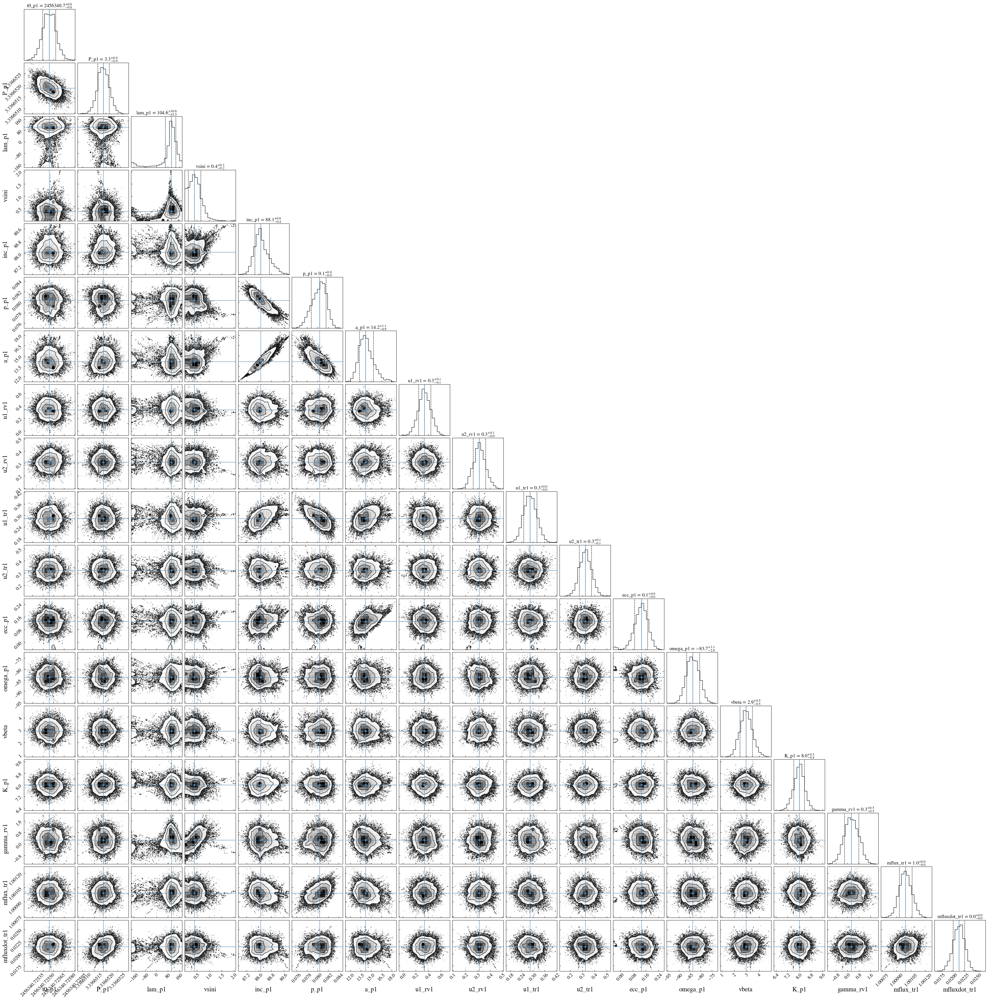

In [17]:
# Plot corner plot
fig = rmfit.mcmc_help.plot_corner(chains_after_burnin,
       show_titles=True,labels=np.array(TF.lpf.ps_vary.descriptions),title_fmt='.1f',xlabcord=(0.5, -0.2),truths=pv_50)